In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import RepeatedStratifiedKFold, train_test_split, GridSearchCV
%matplotlib inline

In [2]:
dataset = pd.read_csv("Desktop\\AI\\training1.csv").iloc[:,1:]
validation = pd.read_csv("Desktop\\AI\\validation1.csv").iloc[:,1:]
test = pd.read_csv("Desktop\\AI\\test1.csv").iloc[:,1:]

In [3]:
print(dataset)


          age  sex  painloc  painexer  relrest        cp  trestbps  htn  \
0    0.368421    1        1         0        1  0.666667  0.259259    0   
1    0.421053    1        1         0        0  0.333333  0.351852    1   
2    0.631579    0        1         0        0  0.666667  0.305556    1   
3    0.684211    0        1         0        0  0.333333  0.537037    1   
4    0.500000    1        1         1        1  1.000000  0.444444    1   
..        ...  ...      ...       ...      ...       ...       ...  ...   
168  0.657895    1        1         1        0  0.666667  0.490741    1   
169  0.263158    1        1         1        1  1.000000  0.259259    0   
170  0.368421    1        1         1        1  1.000000  0.444444    1   
171  0.526316    1        1         1        1  1.000000  0.629630    0   
172  0.394737    1        1         1        1  1.000000  0.259259    0   

         chol  fbs  ...   thalach  thalrest  tpeakbps  tpeakbpd  trestbpd  \
0    0.276062    0  ..

In [4]:
#split dataset
X_train = dataset.iloc[:, : - 1]
y_train = dataset.iloc[:, -1 :]

x_valid = validation.iloc[:,:-1]
y_valid = validation.iloc[:,-1:]

x_test = test.iloc[:,:-1]
y_test = test.iloc[:,-1:]



print("Training set: ")
print(X_train.shape)
print(y_train.shape)
print(Counter(y_train.iloc[:,0]),"\n")

print("Validation set: ")
print(x_valid.shape)
print(y_valid.shape)
print(Counter(y_valid.iloc[:,0]),"\n")

print("Test set: ")
print(x_test.shape)
print(y_test.shape)
print(Counter(y_test.iloc[:,0]),"\n")



Training set: 
(173, 25)
(173, 1)
Counter({0: 110, 1: 63}) 

Validation set: 
(43, 25)
(43, 1)
Counter({0: 27, 1: 16}) 

Test set: 
(73, 25)
(73, 1)
Counter({0: 47, 1: 26}) 



In [5]:
#KNN model
classifier = KNeighborsClassifier(n_neighbors=5, p=2, metric='euclidean')

In [6]:
#KNN fit
classifier.fit(X_train, y_train.squeeze())
print(classifier)

KNeighborsClassifier(metric='euclidean')


In [7]:
#Model prediction
y_pred = classifier.predict(x_valid)
y_pred


array([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1],
      dtype=int64)

In [8]:
#Model Evaluation
vm = confusion_matrix(y_valid, y_pred)
print (vm)


[[25  2]
 [ 6 10]]


In [9]:
y_expected = y_valid
y_pred = classifier.predict(x_valid)
cr = classification_report(y_expected, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.81      0.93      0.86        27
           1       0.83      0.62      0.71        16

    accuracy                           0.81        43
   macro avg       0.82      0.78      0.79        43
weighted avg       0.82      0.81      0.81        43



In [10]:
error = []

for i in range(1,60):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train.squeeze())
    pred_i = knn.predict(x_valid)
    error.append(np.mean(pred_i !=y_valid.squeeze()))

Text(0, 0.5, 'Mean Error')

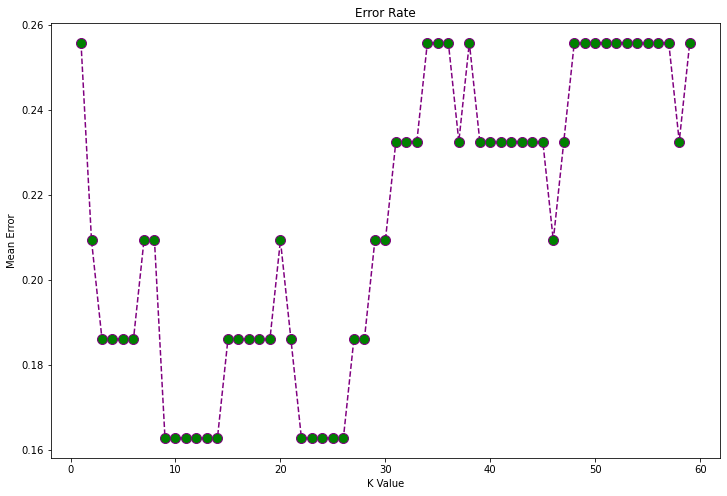

In [11]:
plt.figure(figsize=(12,8))
plt.plot(range(1, 60), error, color='purple', linestyle='dashed', marker='o', markerfacecolor='green', markersize=10)
plt.title('Error Rate')
plt.xlabel('K Value')
plt.ylabel('Mean Error')


In [12]:
classifier_params = {
    "n_neighbors": range(9, 26, 2),
    "weights": ["uniform", "distance"],
    "metric": ["euclidean", "manhattan", "minkowski", "chebychev", "cosine", "correlation"],
    "leaf_size": range(1, 40, 5)
}
classifier = KNeighborsClassifier()

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
grid_search = GridSearchCV(estimator=classifier, param_grid=classifier_params, n_jobs=1, cv=cv, scoring="accuracy", error_score=0)
grid_results = grid_search.fit(X_train, y_train)

end_model = classifier.set_params(**grid_results.best_params_)
end_model.fit(X_train, y_train.squeeze())
y_pred = end_model.predict(x_valid)

print(classification_report(y_valid, y_pred))
print(confusion_matrix(y_valid, y_pred))
print(grid_results.best_params_)



C:\Users\Brend\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Brend\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Brend\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Brend\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sam

              precision    recall  f1-score   support

           0       0.81      0.96      0.88        27
           1       0.91      0.62      0.74        16

    accuracy                           0.84        43
   macro avg       0.86      0.79      0.81        43
weighted avg       0.85      0.84      0.83        43

[[26  1]
 [ 6 10]]
{'leaf_size': 1, 'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'uniform'}


C:\Users\Brend\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Brend\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Brend\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Brend\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sam

In [13]:
#Train best model with training and validation data
end_model = KNeighborsClassifier(leaf_size = 1, metric = 'manhattan', n_neighbors = 15, weights = 'uniform')




In [14]:
#Merge training and validation data
xVD = pd.concat([X_train, x_valid])
yVD = pd.concat([y_train, y_valid])

#Fit the final model on this data
end_model.fit(xVD, yVD.squeeze())


#Evaluate the results on the Test Set
y_pred = end_model.predict(x_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.89      0.90        47
           1       0.81      0.85      0.83        26

    accuracy                           0.88        73
   macro avg       0.86      0.87      0.87        73
weighted avg       0.88      0.88      0.88        73

[[42  5]
 [ 4 22]]


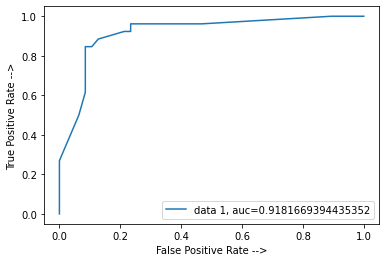

In [15]:
from sklearn.metrics import plot_roc_curve, auc, roc_curve
from sklearn import metrics
y_pred_proba = end_model.predict_proba(x_test) [::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr, label="data 1, auc="+str(auc))

plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')

plt.legend(loc=4)
plt.show()